In [385]:
import matplotlib.pyplot as plt
from sklearn import datasets
import pandas as pd
import numpy as np
import seaborn as sns
import aif360 as aif
from aif360.datasets import GermanDataset

In [454]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

class Profiler:
    """
    A Profile explores bias in a dataset w.r.t. a protected_attribute (e.g. race, gender,
    disability). It stratifies the data into the classes found under the protected_attribute
    feature. It then identifies differences between the strata and their output distributions. TODO:
    If given a specific protected_class, it will stratify the data into two sets, protected and
    non-protected.
    """

    def __init__(self, data, target, protected_attributes: list):
        """
        Parameters:
            data: DataFrame with features as column names, includes target array.
            target: Label of the target feature.
            protected_attribute: The feature of the data that is to be protected from
            discrimination. This column is assumed to be categorical.
        Saved dicts:
            Outer keys: protected attributes
            Inner keys: categories within that attribute
                strata: subsetted dataframe or subsetted vector
                summary: dataframe of summary statistics per strata per feature
        """
        self.data = data
        self.target = target
        self.protected_attributes = protected_attributes
        self.strata = {}
        self.summary = {}
        for attribute in self.protected_attributes:
            self.summary[attribute] = {}
            self.strata[attribute] = {}
            categories = set(data[attribute])
            for category in categories:
                index_vector = (data[attribute] == category)
                data_subset = data[index_vector].drop(attribute, axis=1)
                self.strata[attribute][category] = data_subset
                self.summary[attribute][category] = data_subset.describe()

    def profile(self):
        """
        Compare strata against each other and view summary statistics.
        """
        # strata summaries

        # plots
        for attribute in self.protected_attributes:
            # really should make this look prettier, but here's the gist.
            print("*** DATA PROFILE FOR PROTECTED ATTRIBUTE: ", attribute, " ***")
            
            plt.figure(clear=True)
            box = sns.boxplot(data=self.data, x=attribute, y=self.target)
            plt.suptitle("BOX PLOT")
            plt.title("Quartile distributions of " + self.target + " by " + attribute)
            
            plt.figure(clear=True)
            hist = sns.histplot(data=self.data, hue=attribute, x=self.target)
            plt.suptitle("HISTOGRAM")
            plt.title("Frequency distribution of " + self.target + " by " + attribute)
            
            pairs = sns.pairplot(data=self.data.drop(self.target, axis=1), hue=attribute, diag_kind="hist")
            pairs.fig.suptitle("PAIRWISE PLOTS")
        # compare sets with: basic statistics (box plots), relative frequency histograms
        # LATER: for each category within a protected class), (aif360 visuals)
        # if label class is not given, highlight the strongest differences/correlations


6.29 18.06 37.97


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,upper,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,middle,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,upper,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,upper,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,upper,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,middle,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,middle,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,upper,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,middle,22.0


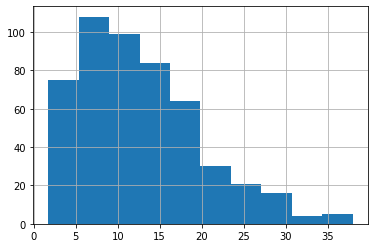

In [455]:
boston_data = datasets.load_boston()
boston_df = pd.DataFrame(boston_data.data, columns=boston_data.feature_names)
boston_df["PRICE"] = boston_data.target
boston_df["LSTAT"].hist()  # of units which houses people of "lower status"
print(boston_df["LSTAT"].quantile(q=0.2), boston_df["LSTAT"].quantile(q=0.8), boston_df["LSTAT"].quantile(q=1))
# the following cut is kinda arbitrary
# upper = 0-20, middle = 21-80, lower = 81-100 (LSTAT is higher for lower class)
boston_df["LSTAT"] = pd.cut(boston_df["LSTAT"], labels=["upper", "middle", "lower"], bins=[0, 6, 18, 40])
boston_df

In [456]:
boston_pf = Profile(boston_df, "PRICE", ["LSTAT"])

*** DATA PROFILE FOR PROTECTED ATTRIBUTE:  LSTAT  ***


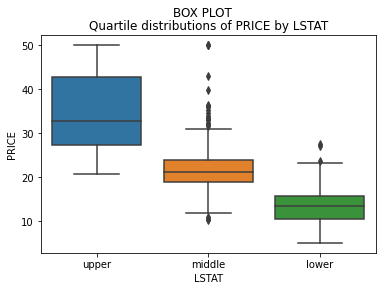

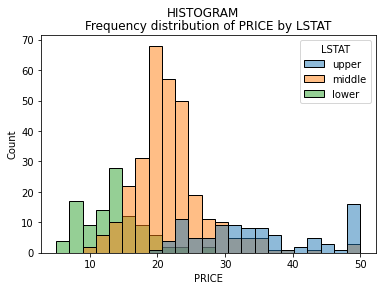

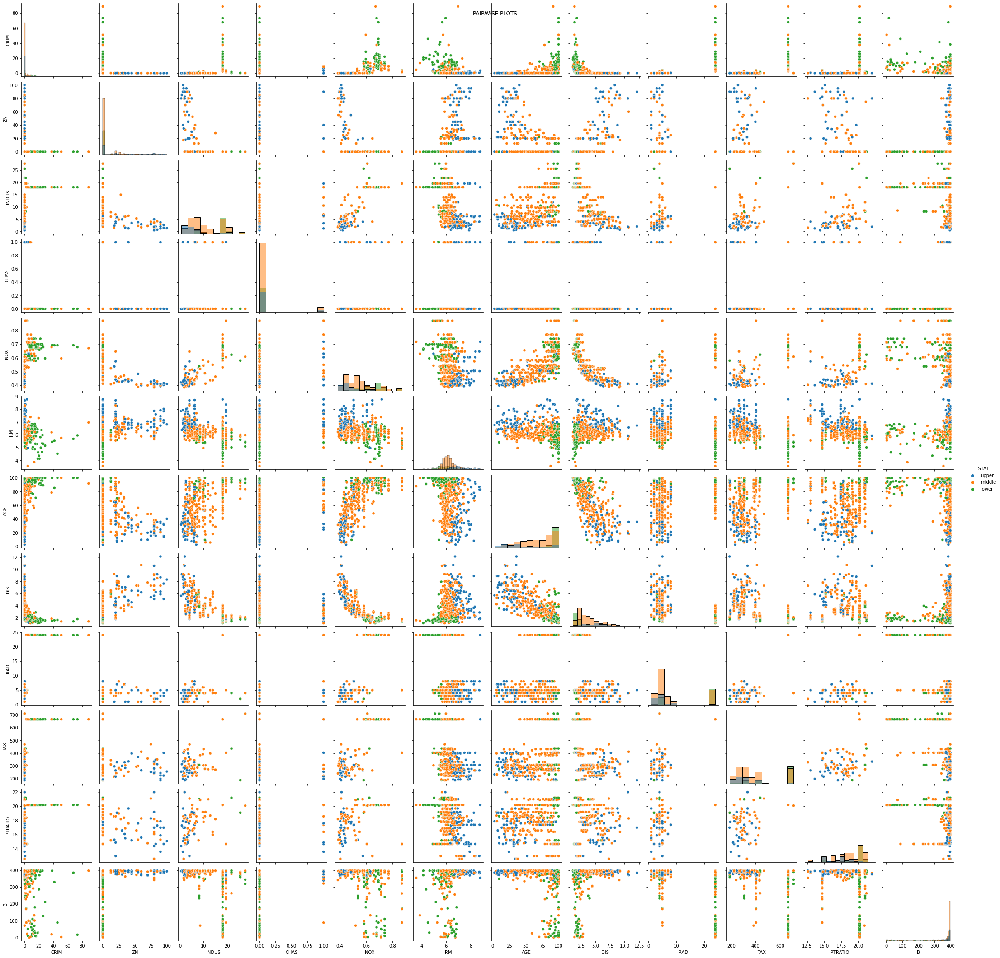

In [457]:
boston_pf.profile()